<a id="0"></a> <br>
**Notebook Content**
1. [Signal preprocessing](#1)
    1. [Reading labelled data and preprocessing](#2)
    1. [Load Data from S3.](#3)
    1. [Adding data labels](#4)
    
1. [Pre-trained models](#5)
    1. [Xception](#6)
    1. [VGG16](#7)
    1. [Incpetion](#8)
    1. [Blend of Xception and VGG16](#9)

 <a id="1"></a> <br>
# 1-Signal preprocessing

This notebook is a gentle introduction to read a mseed file and converting to wav format which is eventually used to generate spectogram of smaller chunked audio clips.

In [1]:
from obspy import read
import wave
from obspy.core import UTCDateTime
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy import signal
import numpy as np
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True) # to render plotly 3-d spectogram in the notebook

import IPython.display as ipd  # To play sound in the notebook
import os
import wave
from IPython.display import Image



#for chunking audio files
from pydub import AudioSegment
from pydub.utils import make_chunks

import json
import pandas as pd
# import boto3
import time
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from keras import backend as K
from os.path import expanduser
import json
from sklearn.model_selection import train_test_split

# from tqdm import tqdm
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
# os.environ["CUDA_VISIBLE_DEVICES"] = "1"

%matplotlib inline

C:\Users\shivraj\Anaconda3\envs\clomask\lib\site-packages\pydub\utils.py:165: RuntimeWarning:

Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work

Using TensorFlow backend.


In [2]:
from keras import backend as k
K.tensorflow_backend._get_available_gpus()

['/job:localhost/replica:0/task:0/device:GPU:0']

In [3]:
# Lets read a mseed url
# This step might take some time reading data from the URL depending on internet speed.

def save_wav_file(data_url,flag):
    stream = read(data_url)
    #lets remove some lower frequency
    sample = stream[0]
    sample.filter('highpass', freq=5.0)

    #Normalize the signal

    sample.normalize()
    sample.data = (sample.data * (2**31-1)).astype('int32')
    sample.write('sample.wav', format='WAV', framerate=64000)
    # Using wave library
    sample_audio = 'sample.wav'
    wav = wave.open(sample_audio)
    print("Sampling (frame) rate = ", wav.getframerate())
    print("Total samples (frames) = ", wav.getnframes())
    print("Duration = ", wav.getnframes()/wav.getframerate())
    sample_audio = AudioSegment.from_file("sample.wav" , "wav") 
    chunk_length = 5000 # chunk it in 5 sec wav files.
    chunks = make_chunks(sample_audio, chunk_length)

    #Export chunks as wav files and save locally in folder 'audio_sample'.
    try:
        os.makedirs('audio_sample')
    except OSError:
        print('Folder already there')
        pass
    if flag == 'whale':
        try:
            os.makedirs('audio_sample/whale')
        except OSError:
            print('Folder already there')
            pass
        for i, chunk in enumerate(chunks):
            chunk_name = "audio_sample/whale/chunk{0}.wav".format(i)
#             print ("exporting", chunk_name)
            chunk.export(chunk_name, format="wav")
    else:
        try:
            os.makedirs('audio_sample/non-whale')
        except OSError:
            print('Folder already there')
            pass
        for i, chunk in enumerate(chunks):
            chunk_name = "audio_sample/non-whale/chunk{0}.wav".format(i)
#             print ("exporting", chunk_name)
            chunk.export(chunk_name, format="wav")

In [4]:
whale_url = 'https://rawdata.oceanobservatories.org/files/RS01SLBS/LJ01A/09-HYDBBA102/2017/10/06/OO-HYVM1--YDH-2017-10-06T20:20:00.000015.mseed'
non_whale_url = 'https://rawdata.oceanobservatories.org/files/RS01SLBS/LJ01A/09-HYDBBA102/2017/10/25/OO-HYVM1--YDH-2017-10-25T00:00:00.000015.mseed'
save_wav_file(whale_url, flag='whale')
save_wav_file(non_whale_url, flag='non-whale')

C:\Users\shivraj\Anaconda3\envs\clomask\lib\site-packages\obspy\core\trace.py:2176: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



Sampling (frame) rate =  64000
Total samples (frames) =  19199872
Duration =  299.998
Folder already there
Folder already there
Sampling (frame) rate =  64000
Total samples (frames) =  19199871
Duration =  299.997984375
Folder already there
Folder already there


In [5]:
#Lets listen to one whale audio
sample_audio_whale = 'audio_sample/whale/chunk0.wav'
ipd.Audio(sample_audio_whale)

In [6]:
#Lets listen to one non-whale audio
sample_audio_non_whale = 'audio_sample/non-whale/chunk0.wav'
ipd.Audio(sample_audio_non_whale)

Let extract essential information from sound files to generate spectogram.
We'll use Scipy spectogram function to get the essential information.

For this we will be tweaking with the 
window size to get a balance between Temporal resolution and Frequency resolution.
Window size is inversly proportional to temporal resolution. More reading here- [Signal processing](https://en.wikipedia.org/wiki/Uncertainty_principle#Signal_processing)

In [7]:
def spectogram_data(audio, sample_rate, window_size=10,
                 step_size=1, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    print(nperseg, noverlap)
    freqs, times, spec = signal.spectrogram(audio,
                                    fs=sample_rate,
                                    window='hann',
                                    nperseg=nperseg,
                                    noverlap=noverlap,
                                    detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

640 64
640 64


Text(0.5, 0, 'Seconds')

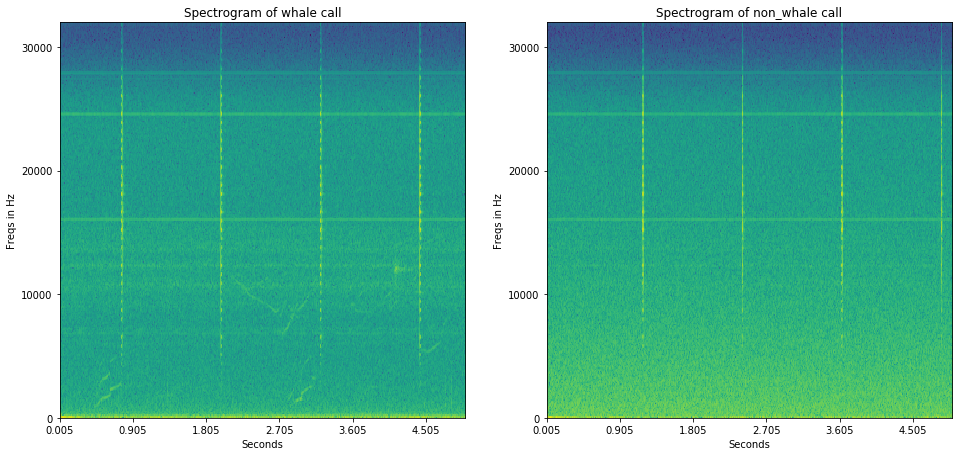

In [8]:
sample_rate, samples = wavfile.read(sample_audio_whale)
frequency_val, time_val, spectrogram = spectogram_data(samples, sample_rate)

fig = plt.figure(figsize=(16, 16))
ax2 = fig.add_subplot(221)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower',
           extent=[time_val.min(), time_val.max(), frequency_val.min(), frequency_val.max()])
ax2.set_yticks(frequency_val[::100])
ax2.set_xticks(time_val[::100])
ax2.set_title('Spectrogram of whale call')
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('Seconds')

sample_rate, samples = wavfile.read(sample_audio_non_whale)
frequency_val, time_val, spectrogram = spectogram_data(samples, sample_rate)

ax2 = fig.add_subplot(222)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower',
           extent=[time_val.min(), time_val.max(), frequency_val.min(), frequency_val.max()])
ax2.set_yticks(frequency_val[::100])
ax2.set_xticks(time_val[::100])
ax2.set_title('Spectrogram of non_whale call')
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('Seconds')

# Lets see how a spectogram looks in 3D

In [9]:
# use plotly to render a 3d representation of spectogram.
data = [go.Surface(z=spectrogram.T)]
layout = go.Layout(
    title='Specgtrogram in 3d',
    scene = dict(
    yaxis = dict(title='Frequencies'),
    xaxis = dict(title='Time'),
    zaxis = dict(title='Log amplitude'),
    ),
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

 <a id="2"></a> <br>
# Reading labelled data and preprocessing
![Whaledr](whaledr_app.png)

In [10]:
#read whale-dr json file to get labelled images
whale_raw = pd.read_json('whale-dr-export.json')

In [11]:
#get all keys from the json
all_val = list(whale_raw.imageCount.keys())
#get image id from resulting list checking keys starting with 'OO_HYVM1'.
image_id = list(filter(lambda x: x.startswith('OO_HYVM1'), all_val))

In [12]:
final_data = pd.DataFrame(columns=['image_id','num_votes','avg_score'])
num_votes = []
avg_score = []
for idx,id in enumerate(image_id):
    num_votes.append(whale_raw.imageCount[id]['num_votes'])
    avg_score.append(whale_raw.imageCount[id]['ave_score'])
final_data['image_id'], final_data['num_votes'], final_data['avg_score'] = image_id, num_votes, avg_score

In [13]:
# data frame with image_id and score
final_data['image_id'] = final_data['image_id'] + '.jpg'
final_data = final_data[final_data['num_votes'] != 0]
final_data.head()

,image_id,num_votes,avg_score
0,OO_HYVM1__YDH_2017_10_06T00_00_00.jpg,1,0.0
1,OO_HYVM1__YDH_2017_10_06T00_00_05.jpg,1,1.0
2,OO_HYVM1__YDH_2017_10_06T00_00_10.jpg,1,1.0
5,OO_HYVM1__YDH_2017_10_06T00_00_25.jpg,1,0.0
7,OO_HYVM1__YDH_2017_10_06T00_00_35.jpg,1,0.0


In [14]:
# check whales and non whales distribution in count.
final_data['avg_score'].value_counts()

0.0    2099
1.0    1772
0.5      93
Name: avg_score, dtype: int64

In [15]:
# get whale and non-whale images based on atleast 1 vote and avg score > 0 being whales.
whale_images = list('whaledr_renamed/' +final_data[(final_data['num_votes'] != 0) & (final_data['avg_score'] > 0)]['image_id'])
non_whale_images = list('whaledr_renamed/' +final_data[(final_data['num_votes'] != 0) & (final_data['avg_score'] == 0)]['image_id'])

 <a id="3"></a> <br>
# Load Data from S3.

We download just the images that have been classified as whales or Non-whales from s3 bucket and putting them in two seperate directories locally.

In [16]:
# save creds of aws to home folder inside creds directory.
home = expanduser("~")
# creds = {'key_id' : '',
#          'key_access' : ''}
# with open(os.path.join(home,'creds.json'), 'a') as cred:
#     json.dump(creds, cred)

In [17]:
#read data from creds folder
with open(os.path.join(home,'creds.json')) as creds_file:
    creds_data = json.load(creds_file)

Below cell is commented out since we already have the data. This can take time depending upon how much data are we downloading from s3.

In [18]:
# #Access Spectogram from S3
# s3 = boto3.resource('s3',aws_access_key_id=creds_data['key_id'],
#          aws_secret_access_key=creds_data['key_access'])
# bucket = s3.Bucket('himatdata')
# home = os.getcwd()
# i = 0
# for obj in bucket.objects.filter(Delimiter='', Prefix='whaledr_renamed/OO_HYVM1'):
#     if obj.key in whale_images:
#         bucket.download_file(obj.key,os.path.join(os.path.join(home,'train_images/whale',obj.key[16:])))
#     elif obj.key in non_whale_images:
#         bucket.download_file(obj.key,os.path.join(os.path.join(home,'train_images/non_whale',obj.key[16:])))

 <a id="4"></a> <br>
# Adding data labels.

In [19]:
from keras.preprocessing import image

train_dir = os.path.join(os.getcwd() + os.sep + 'train_images')
CATEGORIES = ['whale', 'non_whale']
NUM_CATEGORIES = len(CATEGORIES)
for category in CATEGORIES:
    print('{} {} images'.format(category, len(os.listdir(os.path.join(train_dir, category)))))

whale 1834 images
non_whale 2038 images


In [20]:
def read_img(filepath, size):
    img = image.load_img(os.path.join(train_dir, filepath), target_size=size)
    img = image.img_to_array(img)
    return img

In [21]:
# adding labels to the data frame
final_data['category'] = np.where(final_data['avg_score'] > 0, 'whale', 'non_whale')
final_data['image_id'] = np.where(final_data['avg_score'] > 0 , 'whale' + os.sep + final_data['image_id'], 'non_whale' + os.sep + final_data['image_id'])

In [22]:
final_data['category'].value_counts()

non_whale    2099
whale        1865
Name: category, dtype: int64

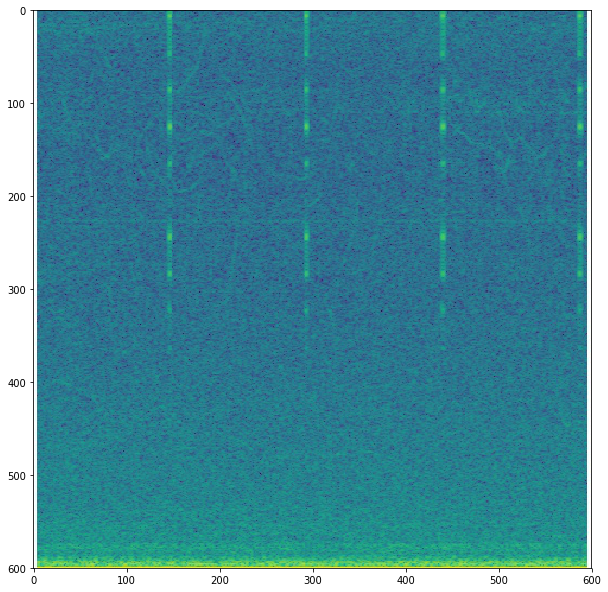

In [46]:
# plotting sample image
img = read_img(final_data['image_id'][1], (600, 600))
plt.figure(figsize = (10,30))
plt.imshow(img / 255.)
plt.show()

 <a id="5"></a> <br>
# Pre-trained models

Transfer learning is a popular method in computer vision which allows us to build models in a timesaving way using pretrained models instead of training from scratch.

## Transfer Learning

With transfer learning, we basically try to exploit what has been learned in one task to improve generalization in another. We transfer the weights or learned features that a Network has learned at Task 1 to a new Task 2.

If we have significantly more data for task Task 1, we may utilize its learning, and generalize this knowledge (features, weights) for task Task 2 (which has significantly less data). In the case of problems in the computer vision domain, certain low-level features, such as edges, shapes, corners and intensity are usually shared between images so transfer learning help learning this features from scrath again.
![Image of Yaktocat](https://3qeqpr26caki16dnhd19sv6by6v-wpengine.netdna-ssl.com/wp-content/uploads/2017/09/Three-ways-in-which-transfer-might-improve-learning.png)

 <a id="6"></a> <br>
# Xception

We are using xception models for transfer leanring.

We are fixing the input size and skipping missing images not found on s3 but are there on firebase.

In [24]:
from keras.applications import xception
INPUT_SIZE = 299
skipped_ag = []
x_train = np.zeros((len(final_data), INPUT_SIZE, INPUT_SIZE, 3), dtype='float32')
for i, file in (enumerate(final_data['image_id'])):
    try:
        img = read_img(file, (INPUT_SIZE, INPUT_SIZE))
        x = xception.preprocess_input(np.expand_dims(img.copy(), axis=0))
        x_train[i] = x
    except Exception:
        skipped_ag.append(i)
        pass
# print(skipped_ag)
print('Train Images shape: {} '.format(x_train.shape))

Train Images shape: (3964, 299, 299, 3) 


In [25]:
# deleting images_id for corresponding missing images on s3
x_train = np.delete(x_train,skipped_ag,axis=0)
final_data = final_data.drop(final_data.index[skipped_ag])
final_data = final_data.reset_index(drop=True)

In [26]:
# validation_split
y_train = final_data['category'].values
Xtr, Xv, ytr, yv = train_test_split(x_train, y_train,test_size=0.1,random_state=29)

In [27]:
# include top as false remove the fully conected layers and uses just convolution layers to get features.
POOLING = 'max'
print((Xtr.shape, Xv.shape, ytr.shape, yv.shape))
xception_bottleneck_features = xception.Xception(weights='imagenet', include_top=False, pooling=POOLING)
train_xception_bf = xception_bottleneck_features.predict(Xtr, batch_size=64, verbose=1)
valid_xception_bf = xception_bottleneck_features.predict(Xv, batch_size=64, verbose=1)
print('Xception train bottleneck features shape: {} size: {:,}'.format(train_xception_bf.shape, train_xception_bf.size))
print('Xception valid bottleneck features shape: {} size: {:,}'.format(valid_xception_bf.shape, valid_xception_bf.size))

((3484, 299, 299, 3), (388, 299, 299, 3), (3484,), (388,))
388/388 [==============================] - 5s 14ms/step
Xception train bottleneck features shape: (3484, 2048) size: 7,135,232
Xception valid bottleneck features shape: (388, 2048) size: 794,624


We'll now apply simple logit model on bottleneck features fine tuning the regularization.

In [28]:
logreg = LogisticRegression(solver='lbfgs', random_state=2018, C=0.003)
logreg.fit(train_xception_bf, ytr)
valid_probs = logreg.predict_proba(valid_xception_bf)
valid_preds = logreg.predict(valid_xception_bf)
print('Validation Xception Accuracy {}'.format(round(accuracy_score(yv, valid_preds),2)))

Validation Xception Accuracy 0.76


C:\Users\shivraj\Anaconda3\envs\clomask\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning:

lbfgs failed to converge. Increase the number of iterations.



In [29]:
from sklearn.metrics import roc_auc_score
roc_auc_score(yv, valid_probs[:,1])

0.8207062600321028

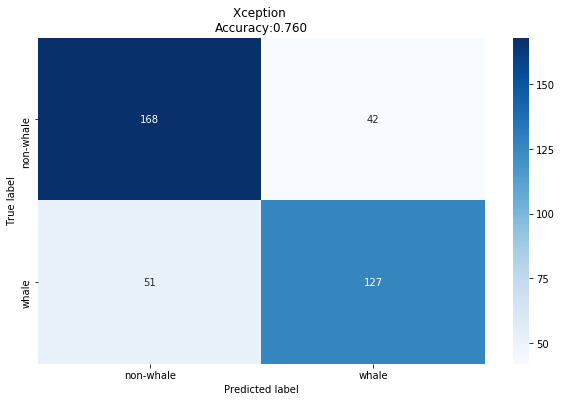

In [30]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Creates a confusion matrix
cm = confusion_matrix(yv, valid_preds)

# Transform to df for easier plotting
cm_df = pd.DataFrame(cm,
                     index = ['non-whale','whale'], 
                     columns = ['non-whale','whale'])

plt.figure(figsize=(10,6))
sns.heatmap(cm_df, annot=True,fmt='g',cmap='Blues')
plt.title('Xception \nAccuracy:{0:.3f}'.format(round(accuracy_score(yv, valid_preds),2)))
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

## Lets test our model

In [31]:
# # sample_audio = 'test_data/OO_HYVM1__YDH_2017_10_06T19_50_45.wav'
# sample_audio = AudioSegment.from_file("test_data/OO_HYVM1__YDH_2017_10_06T19_50_45.wav" , "wav") 
# chunk_length = 5000 # chunk it in 5 sec wav files.
# chunks = make_chunks(sample_audio, chunk_length)
# for i, chunk in enumerate(chunks):
#     chunk_name = "audio_sample/test/chunk{0}.wav".format(i)
#     print ("exporting", chunk_name)
#     chunk.export(chunk_name, format="wav")

In [32]:
#Lets listen to one non-whale audio
sample_audio_non_whale = 'audio_sample/test/chunk0.wav'
ipd.Audio(sample_audio_non_whale)

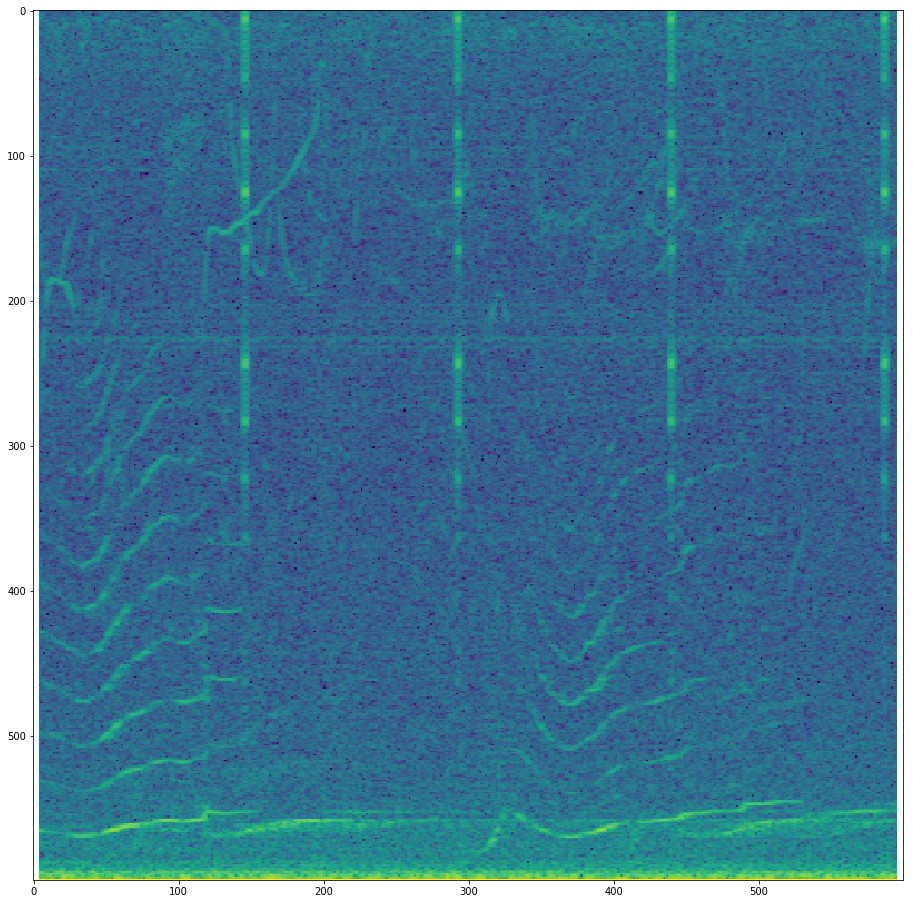

In [33]:
test_image = 'test_data\OO_HYVM1__YDH_2017_10_06T19_50_45.jpg'
# plotting sample image
img = read_img(test_image, (600, 600))
fig = plt.figure(figsize=(16, 16))
plt.imshow(img / 255.)
plt.show()

In [34]:
img = read_img(test_image, (INPUT_SIZE, INPUT_SIZE))
test = xception.preprocess_input(np.expand_dims(img.copy(), axis=0))

In [35]:
test_xception_bf = xception_bottleneck_features.predict(test, verbose=1)

1/1 [==============================] - 0s 169ms/step


In [36]:
print('Its a:',logreg.predict(test_xception_bf)[0])

Its a: whale
